In [1]:
%matplotlib
%load_ext autoreload
%autoreload 2

Using matplotlib backend: agg


In [17]:
import proplot as pro
from astropy.io import fits
from vampires_dpp.indexing import frame_angles, frame_radii
import numpy as np
from astropy.visualization import simple_norm
from matplotlib.colors import TwoSlopeNorm

In [12]:
stokes_sp_cube = fits.getdata("~/research/papers/HD169142_disk_paper/src/data/20230707_VAMPIRES/20230707_HD169142_vampires_stokes_cube.fits")
stokes_cube = np.sum(stokes_sp_cube, axis=0)

In [36]:
def plot(cube):
    r2 = frame_radii(cube)**2
    cube_plot = cube * r2

    hw = cube_plot.shape[-1] / 2 * 5.9e-3
    ext = (hw, -hw, -hw, hw)
    fig, axes = pro.subplots(ncols=4)
    maxval = np.nanpercentile(np.abs(cube_plot[2:4]), 99)
    norm = TwoSlopeNorm(vcenter=0, vmin=-maxval, vmax=maxval)
    axes[0].imshow(cube_plot[2], extent=ext, origin="lower", cmap="bwr", norm=norm)
    axes[1].imshow(cube_plot[3], extent=ext, origin="lower", cmap="bwr", norm=norm)
    maxval = np.nanpercentile(np.abs(cube_plot[4]), 99)
    norm = TwoSlopeNorm(vcenter=0, vmin=-maxval, vmax=maxval)
    axes[2].imshow(cube_plot[4], extent=ext, origin="lower", cmap="twilight", norm=norm)
    axes[3].imshow(cube_plot[5], extent=ext, origin="lower", cmap="twilight", norm=norm)
    axes.format(toplabels=("Q", "U", "Qphi", "Uphi"), xlim=(0.8, -0.8), ylim=(-0.8, 0.8), grid=False)
    return fig

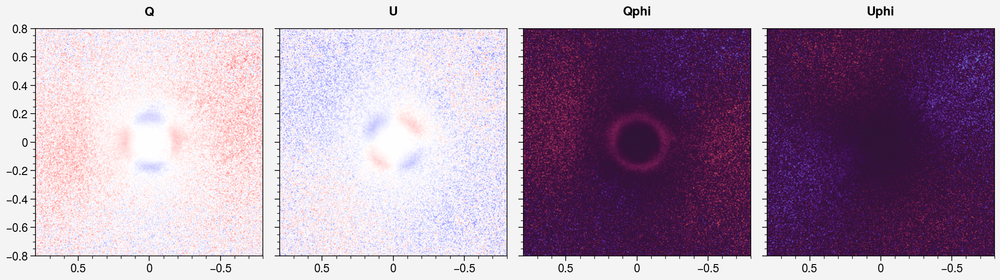

In [37]:
plot(stokes_cube)

In [62]:
def azimuthal_stokes(Q, U, phi=0):
    angles = frame_angles(Q, conv="astro")
    cos2th = np.cos(2 * (angles + phi))
    sin2th = np.sin(2 * (angles + phi))
    Qphi = -Q * cos2th - U * sin2th
    Uphi = Q * sin2th - U * cos2th
    return Qphi, Uphi

def remove_background_pol(stokes_cube):
    radii = frame_radii(stokes_cube)
    # annulus
    ann_mask = (radii > 140) & (radii < 250)
    # Q signal
    cQ = np.nanmean(stokes_cube[2] * ann_mask)
    # U signal
    cU = np.nanmean(stokes_cube[3] * ann_mask)
    out = stokes_cube.copy()
    out[2] -= cQ
    out[3] -= cU
    out[4], out[5] = azimuthal_stokes(out[2], out[3])
    return out

def rotate_stokes(stokes_cube, theta):
    out = stokes_cube.copy()
    sin2ts = np.sin(2 * theta)
    cos2ts = np.cos(2 * theta)
    out[2] = stokes_cube[2] * cos2ts - stokes_cube[3] * sin2ts
    out[3] = stokes_cube[2] * sin2ts + stokes_cube[3] * cos2ts
    out[4], out[5] = azimuthal_stokes(out[2], out[3])
    return out

In [63]:
cube2 = remove_background_pol(stokes_cube)

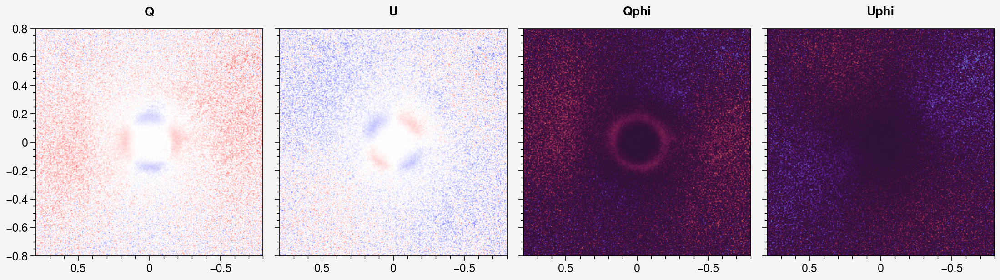

In [64]:
plot(cube2)

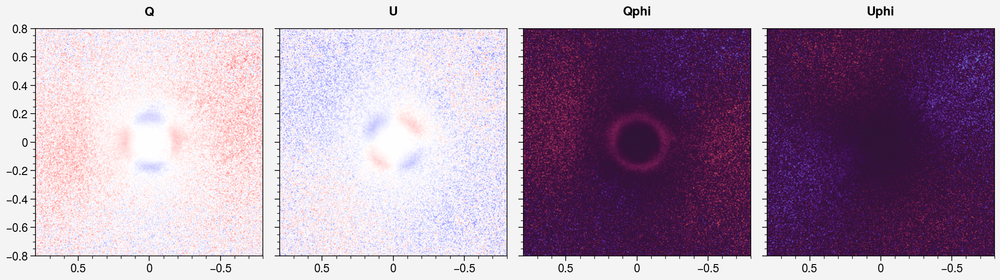

In [61]:
cube3 = rotate_stokes(stokes_cube, np.deg2rad(180))
plot(cube3)

In [150]:
def meas_unres_pol_sub(stokes_cube):
    radii = frame_radii(stokes_cube)
    # annulus
    ann_mask = (radii > 50) & (radii < 70)
    ann_mask |= (radii > 150) & (radii < 250)

    qstar = np.nansum(stokes_cube[2][ann_mask])
    iqstar = np.nansum(stokes_cube[0][ann_mask])
    ustar = np.nansum(stokes_cube[3][ann_mask])
    iustar = np.nansum(stokes_cube[1][ann_mask])
    cQ = qstar / iqstar
    cU = ustar / iustar
    print(f"{cQ=} {cU=}")
    out = stokes_cube.copy()
    out[2] -= out[0] * cQ
    out[3] -= out[1] * cU
    out[4], out[5] = azimuthal_stokes(out[2], out[3])
    return out
    

cQ=0.0025482375354661316 cU=-0.0019411935385779176
0.799774618694225


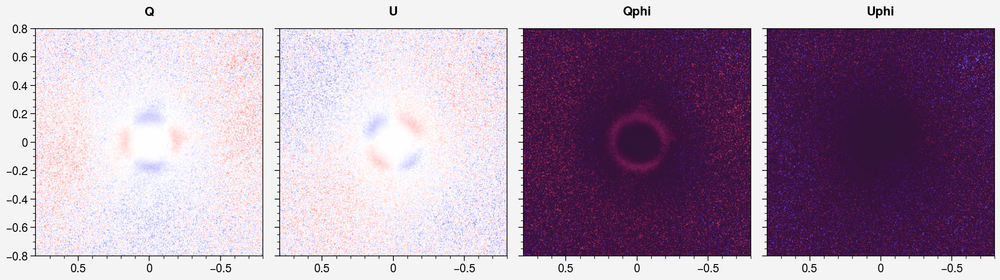

In [151]:
cube4 = meas_unres_pol_sub(stokes_cube)
print(np.nansum((cube4[5] * frame_radii(cube4)**2)**2))
plot(cube4)

In [122]:
fits.writeto("test_cube.fits", cube4, overwrite=True)
fits.writeto("test_cube_r2.fits", cube4 * frame_radii(cube4)**2, overwrite=True)